Map expansion tutorial


(<Figure size 5295.25x7448.75 with 1 Axes>, <Axes:>)

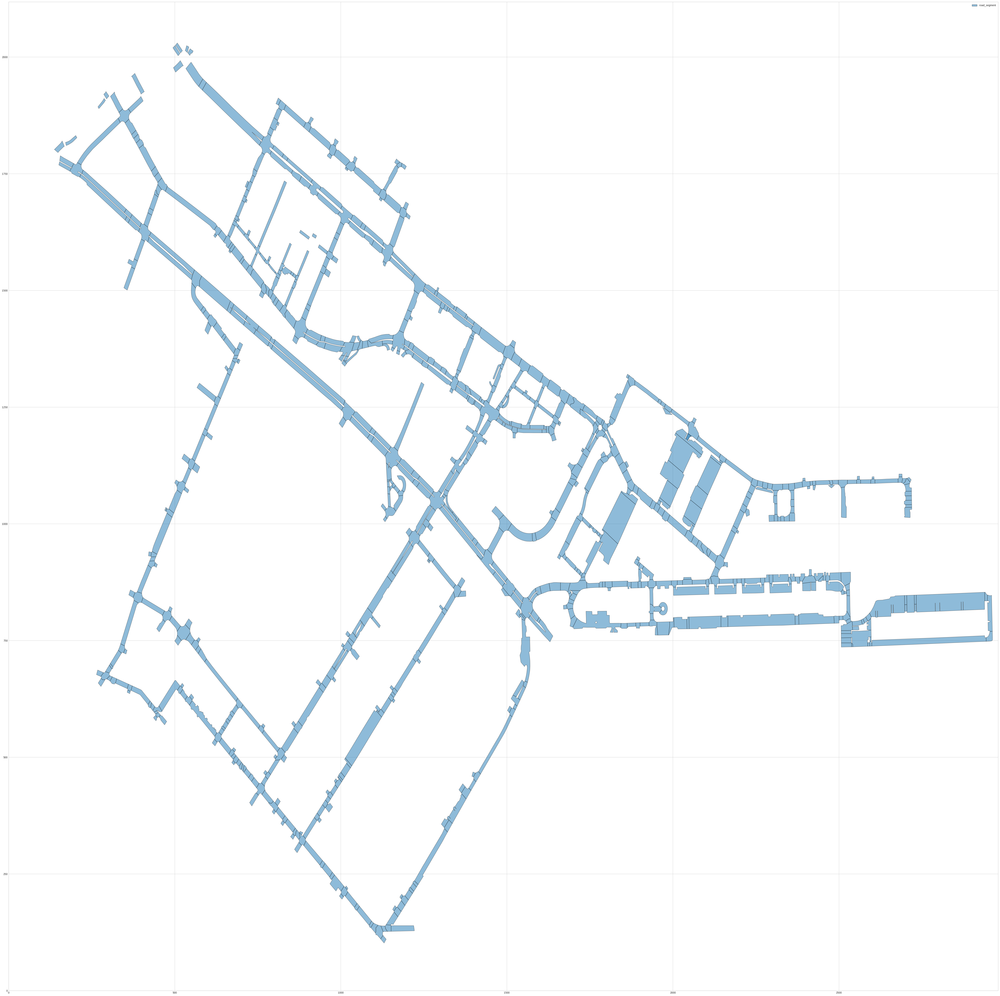

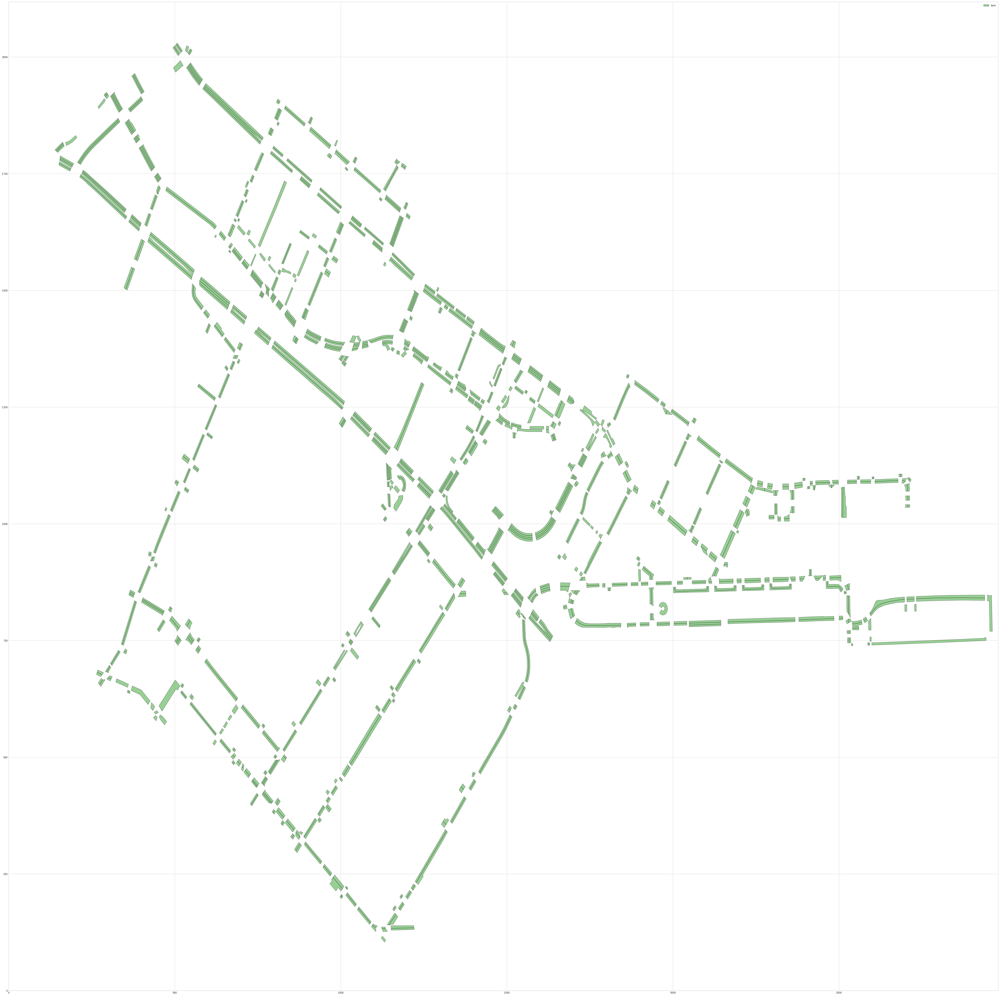

In [66]:
import matplotlib.pyplot as plt
import tqdm
import numpy as np
import os

from nuscenes.map_expansion.map_api import NuScenesMap
from nuscenes.map_expansion import arcline_path_utils
from nuscenes.map_expansion.bitmap import BitMap


nusc_map = NuScenesMap(dataroot='/home/qichen/projects/MapTR-main/data/nuscenes', map_name='boston-seaport')

# These are the non-geometric layers which have polygons as the geometric descriptors.
non_geometric_polygon_layers = ['drivable_area', 'road_segment', 'road_block', 'lane', 'ped_crossing', 'walkway', 'stop_line', 'carpark_area']
non_geometric_line_layers = ['road_divider', 'lane_divider', 'traffic_light']
# layer_names = ['polygon', 'line', 'node', 'drivable_area', 'road_segment', 'road_block', 'lane', 'ped_crossing', 'walkway', 'stop_line', 'carpark_area', 'lane_connector', 'road_divider', 'lane_divider', 'traffic_light']
# layer_names = ['drivable_area', 'road_segment', 'road_block', 'lane', 'ped_crossing', 'walkway', 'stop_line', 'carpark_area']
# nusc_map.render_layers([non_geometric_line_layers], figsize=5)

# nusc_map.render_layers(non_geometric_polygon_layers, figsize=5)
# nusc_map.render_layers(['lane'], figsize=5)
nusc_map.render_layers(['road_segment'], figsize=5)
nusc_map.render_layers(['lane'], figsize=5)
# nusc_map.render_layers(['ped_crossing', ], figsize=5)
# nusc_map.render_layers(['drivable_area','road_block', 'road_segment' ], figsize=5)


# nusc_map.render_layers(['road_block', 'lane'], figsize=5)


# nusc_map.render_layers(non_geometric_line_layers, figsize=5)
# nusc_map.render_layers(['road_divider','lane_divider'], figsize=5)


# nusc_map.render_layers(layer_names, figsize=1)



/home/qichen/anaconda3/envs/hdmapnet_py38/lib/python3.8/site-packages/descartes/patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
/home/qichen/anaconda3/envs/hdmapnet_py38/lib/python3.8/site-packages/descartes/patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])


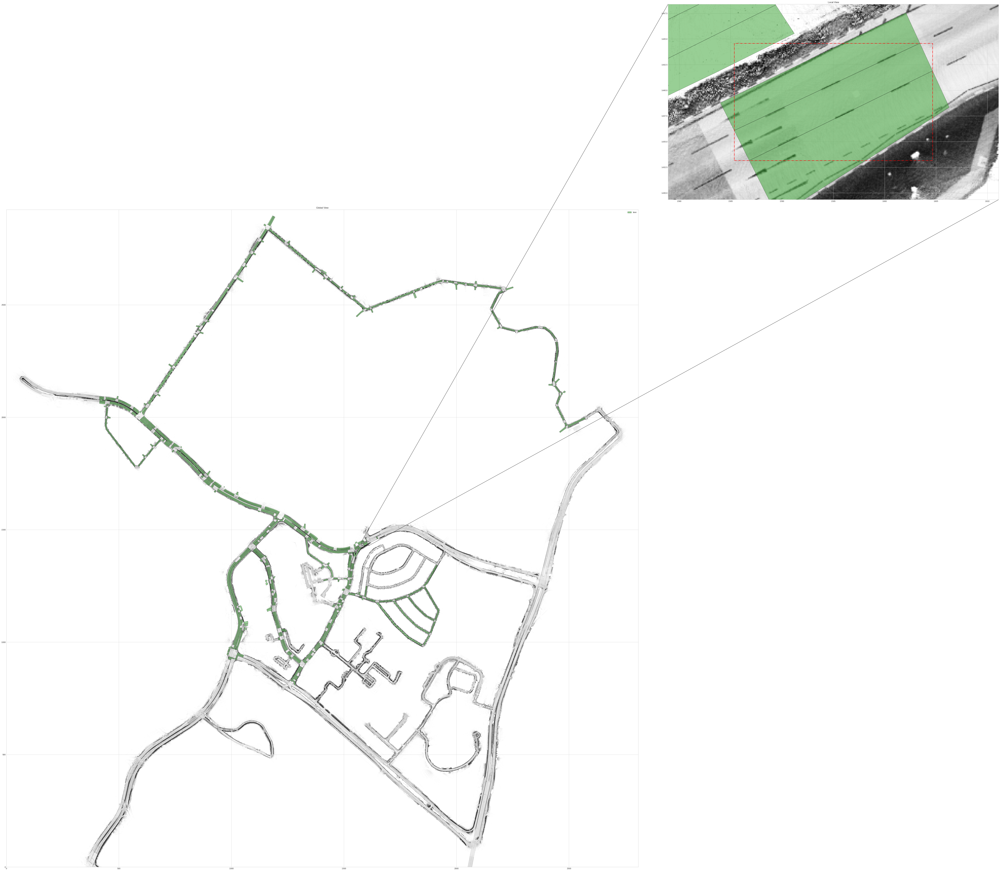

In [63]:
# patch_box = (1000, 1000, 1000, 1000) 
from nuscenes.map_expansion.bitmap import BitMap

bitmap = BitMap(nusc_map.dataroot, nusc_map.map_name, 'basemap')

# fig, ax = nusc_map.render_record('lane', nusc_map.lane[14]['token'], other_layers=[], bitmap=bitmap)
# fig, ax = nusc_map.render_record('road_segment', nusc_map.road_segment[-1]['token'], other_layers=['road_divider'], bitmap=bitmap, figsize=5)
fig, ax = nusc_map.render_record('road_block', nusc_map.road_block[-1]['token'], other_layers=[], bitmap=bitmap, figsize=5)

fig, ax = nusc_map.render_record('lane', nusc_map.lane[-1]['token'], other_layers=[], bitmap=bitmap, figsize=5)

    


render map layers from local view of global map from above

In [ ]:
patch_box = (1000, 1000, 800, 800) #patch_box: Patch box defined as [x_center, y_center, height, width].
patch_angle = 0
# Default orientation where North is up
# layer_names = ['road_segment', 'lane']
# layer_names = ['lane']
layer_names = ['road_segment']

# layer_names = ['road_divider','road_segment', 'lane', 'ped_crossing', 'walkway', 'stop_line', 'carpark_area']
canvas_size = (1000,1000)
map_mask = nusc_map.get_map_mask(patch_box, patch_angle, layer_names, canvas_size)
map_mask[-1]

figsize = (30, 10)
fig, ax = nusc_map.render_map_mask(patch_box, patch_angle, layer_names, canvas_size, figsize=figsize, n_row=1)
nusc_map.geometric_layers

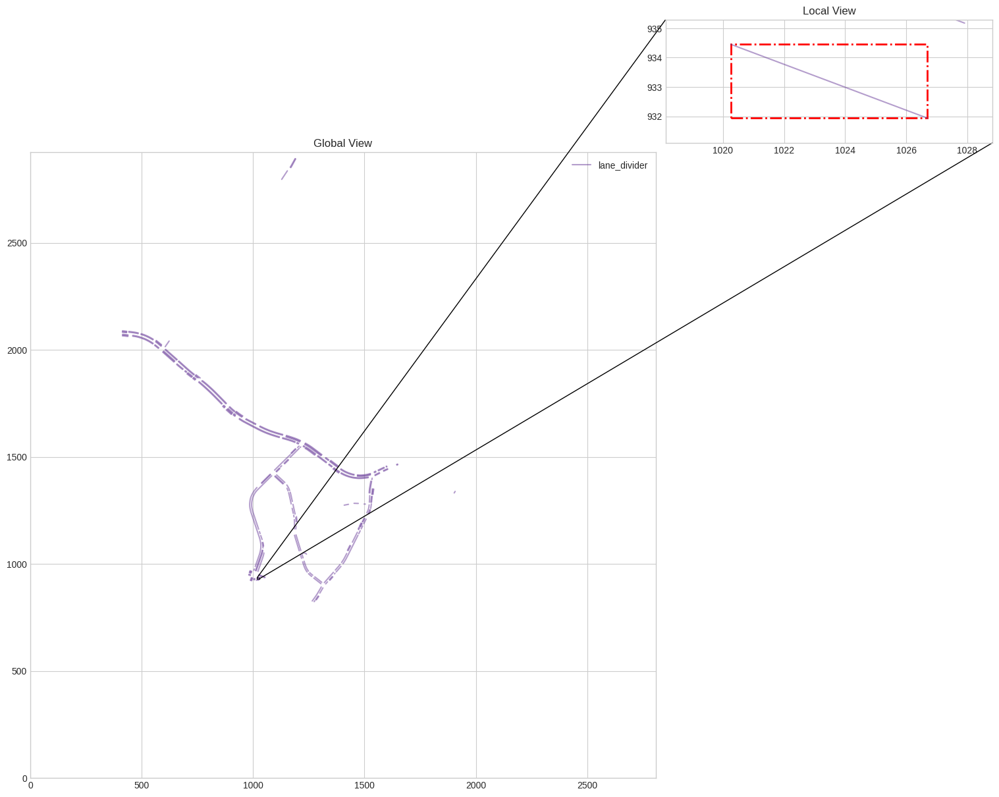

In [23]:
sample_road_divider_record = nusc_map.lane_divider[-1]
sample_road_divider_record

sample_lane_divider = nusc_map.lane_divider[0]
fig, ax = nusc_map.render_record('lane_divider', sample_lane_divider['token'], other_layers=[])


{'token': '08d0c9fa-bbe2-4614-a0c8-b77d91fc8ce1', 'polygon_token': '3371beef-e01e-4918-9bbc-27097e036d48', 'is_intersection': True, 'drivable_area_token': '', 'exterior_node_tokens': ['235ba1e6-7789-4e6f-a38d-43b4f0a29301', '3cee7d4c-d1f8-49e9-a299-78f28e68255e', '826dc1bc-05ee-4d0f-939d-9a61b58f90aa', '19c48bc5-4a51-4c85-97dc-6541b945522b', '00b890d8-7092-481a-a299-8a2d1bdaaa56', '722c520b-719c-4c02-93d2-581e2258140c', '45d3ac12-e279-4d90-a6c7-a745f9cd04bd', 'a2c31e69-5701-4609-b4d4-72548b18ef1b', 'b88d64d5-cf1a-4ca4-bfae-5925aaa51861', '82660e31-b945-44a5-b767-f29a0c078660', 'b16e6f5d-965d-4bd2-bf1a-d72ebcc92b06', '9b7e2e6d-d796-4931-a878-b749c00f3fa4', '570990e1-15d2-4425-a916-a68143394a6c', '3cd91402-c559-4cb9-8f79-b49cf7d691b0', 'e0311113-b735-4b14-bf2d-fb939b88fb1f', '6fe1bf61-a604-4f59-827e-c393c89084bc', '843b87dd-ff22-4560-8cf1-cea38721b0bc', 'a813f154-9370-4bc9-8b6f-117458213919', '5f211774-b16e-46a2-8419-859a557d64e5', 'd61b1ed0-9922-4570-a909-0ac5e1907c66', '6ba0d84c-8059-4

/home/qichen/anaconda3/envs/hdmapnet_py38/lib/python3.8/site-packages/descartes/patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([


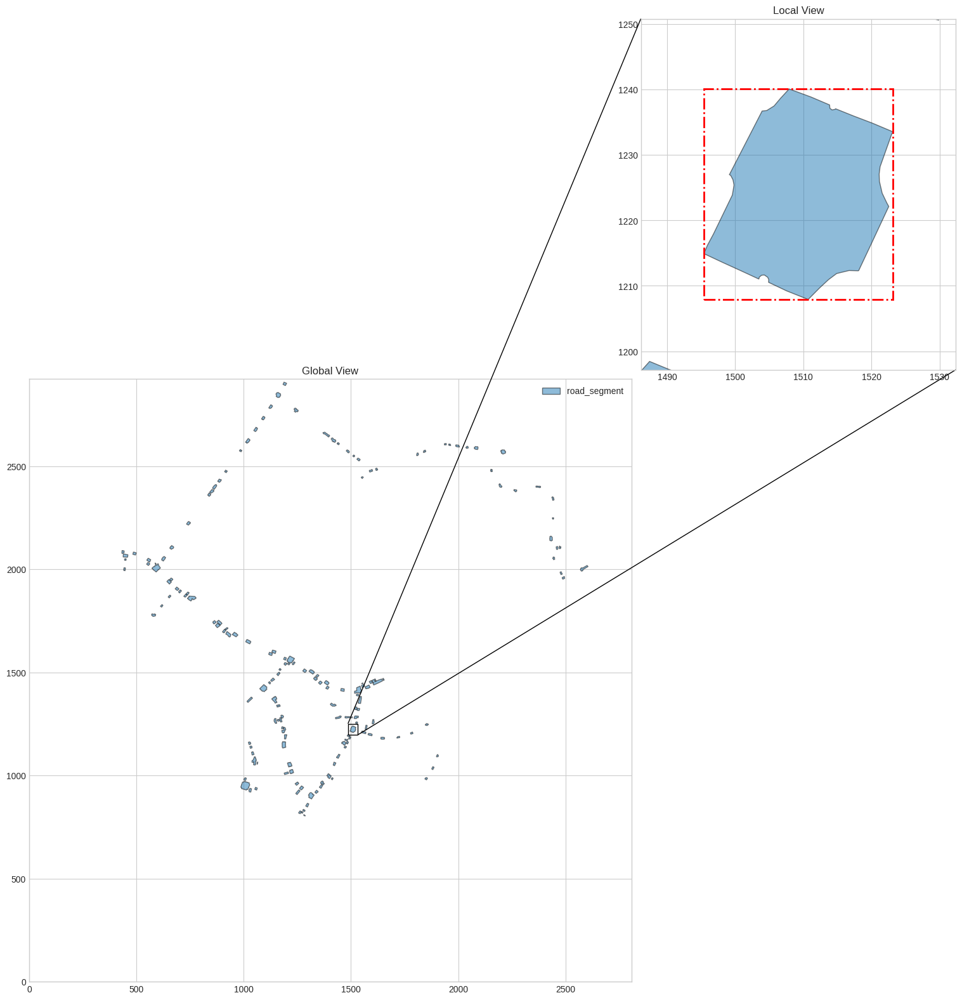

In [29]:
sample_intersection_road_segment = nusc_map.road_segment[3]
print(sample_intersection_road_segment)
fig, ax = nusc_map.render_record('road_segment', sample_intersection_road_segment['token'], other_layers=[])


In [4]:
from nuscenes.nuscenes import NuScenes

nusc = NuScenes(version='v1.0-test', dataroot='/home/qichen/projects/Nuscene-full/', verbose=True)



Loading NuScenes tables for version v1.0-test...
23 category,
8 attribute,
4 visibility,
0 instance,
12 sensor,
1800 calibrated_sensor,
462901 ego_pose,
15 log,
150 scene,
6008 sample,
462901 sample_data,
0 sample_annotation,
4 map,
Done loading in 2.044 seconds.
Reverse indexing ...
Done reverse indexing in 0.9 seconds.


{'nbr_samples': 40,
 'name': 'scene-0081',
 'last_sample_token': '5d0c5f6c94294057b51fdbcb86cc071a',
 'description': '## No descriptions available for the test set. ##',
 'token': 'b730a92c13f7477aba6422f522f0f00d',
 'log_token': 'ceb76203d8d7415f83ae3f81e112a0ca',
 'first_sample_token': 'c65eed10964644b092a185bdcf047d3d'}

In [8]:
nusc.scene[5]
nusc.sensor